# Double pendulum using Lagrange's equation

Defines a LagrangianPendulum class that is used to generate basic pendulum plots from solving Lagrange's equations.

* Last revised 17-Mar-2019 by Dick Furnstahl (furnstahl.1@osu.edu).
* Last revised 20-Apr-2022 by Leo Deer (deer.279@osu.edu).

## Equations of Motion 

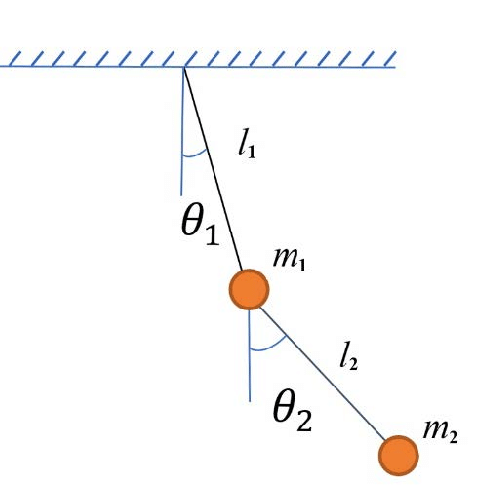

For this double pendulum, we will use the Lagrangian formulation with generalized coordinates $\theta_1$ & $\theta_2$. From this we find our lagragian,

$\begin{align}
  \mathcal{L} = \frac12 (m_1 + m_2) l_1^2 \dot\theta_1^2  + \frac12 m_2 l_2^2 \dot\theta_2^2 + m_2 l_1 l_2 \cos(\theta_1 - \theta_2) \dot\theta_1 \dot\theta_2 + g (m_1 + m_2) l_1 \cos(\theta_1) + g m_2 l_2 \cos(\theta_2)
\end{align}$

Once we apply the euler lagrange equations for our two coordinates, we obtain,

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\theta_1} = \frac{\partial\mathcal L}{\partial\theta_1}
 \quad\Longrightarrow\quad
 -g (m_1 + m_2) \sin\theta_1 = (m_1 + m_2) l_1 \ddot\theta_1 + m_2 l_2 \sin(\theta_1 - \theta_2) \dot\theta_2^2 + m_2 l_2 \cos(\theta_1 - \theta_2) \ddot\theta_2
\end{align}$

$\begin{align}
 \frac{d}{dt}\frac{\partial\mathcal{L}}{\partial \dot\theta_2} = \frac{\partial\mathcal L}{\partial\theta_2}
 \quad\Longrightarrow\quad
 -g \sin\theta_2 = l_2 \ddot\theta_2 + l_1 \sin(\theta_2 - \theta_1) \dot\theta_1^2 + l_1 \cos(\theta_2 - \theta_1) \ddot\theta_1
    \;.
\end{align}$

From these we may solve for $\ddot\theta_1$ & $\ddot\theta_2$ to find our equations of motion
$\begin{align}
 \ddot\theta_1 = \frac{g m_2 \cos(\theta_1 - \theta_2) \sin\theta_2 - m_2 l_1 \cos(\theta_1 - \theta_2) \sin(\theta_1 - \theta_2) \dot\theta_1^2 - m_2 l_2 \sin(\theta_1 - \theta_2) \dot\theta_2^2 - g (m_1 + m_2) \sin\theta_1}{(m_1 + m_2) l_1 - m_2 l_1 \cos(\theta_1 - \theta_2)^2}
\end{align}$

$\begin{align}
 \ddot\theta_2 = \frac{g (m_1 + m_2) \cos(\theta_2 - \theta_1) \sin\theta_1 - m_2 l_2 \cos(\theta_2 - \theta_1) \sin(\theta_2 - \theta_1) \dot\theta_2^2 - (m_1 + m_2) l_1 \sin(\theta_2 - \theta_1) \dot\theta_1^2 - g (m_1 + m_2) \sin\theta_2}{(m_1 + m_2) l_2 - m_2 l_2 \cos(\theta_2 - \theta_1)^2}
\end{align}$

These are two coupled $2^{nd}$ order equations, but we may rewrite them as $4$ $1^{st}$ order equations by introducing $\omega_1 = \dot\theta_1$ & $\omega_2 = \dot\theta_2$ which gives

$\begin{align}
 \dot\omega_1 = \frac{g m_2 \cos(\theta_1 - \theta_2) \sin\theta_2 - m_2 l_1 \cos(\theta_1 - \theta_2) \sin(\theta_1 - \theta_2) \omega_1^2 - m_2 l_2 \sin(\theta_1 - \theta_2) \omega_2^2 - g (m_1 + m_2) \sin\theta_1}{(m_1 + m_2) l_1 - m_2 l_1 \cos(\theta_1 - \theta_2)^2}
\end{align}$

$\begin{align}
 \dot\theta_1 = \omega_1
\end{align}$

$\begin{align}
 \dot\omega_2 = \frac{g (m_1 + m_2) \cos(\theta_2 - \theta_1) \sin\theta_1 - m_2 l_2 \cos(\theta_2 - \theta_1) \sin(\theta_2 - \theta_1) \omega_2^2 - (m_1 + m_2) l_1 \sin(\theta_2 - \theta_1) \omega_1^2 - g (m_1 + m_2) \sin\theta_2}{(m_1 + m_2) l_2 - m_2 l_2 \cos(\theta_2 - \theta_1)^2}
\end{align}$

$\begin{align}
 \dot\theta_2 = \omega_2
\end{align}$

These are what we shall solve.

In [1]:
%matplotlib inline

In [2]:
import numpy as np
from scipy.integrate import odeint, solve_ivp

import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

In [3]:
# The dpi (dots-per-inch) setting will affect the resolution and how large
#  the plots appear on screen and printed.  So you may want/need to adjust 
#  the figsize when creating the figure.
plt.rcParams['figure.dpi'] = 100.    # this is the default for notebook

# Change the common font size (smaller when higher dpi)
font_size = 12
plt.rcParams.update({'font.size': font_size})

## Double pendulum class and utility functions

In [4]:
class LagrangianDPendulum():
    """
    Double Pendulum class implements the parameters and Lagrange's equations for 
     a simple double pendulum (no driving or damping).
     
    Parameters
    ----------
    L1 : float
         length of the first pendulum
    L2 : float
         length of the second pendulum
    m1 : float
         mass of the first pendulum
    m2 : float
         mass of the second pendulum
    g : float
        gravitational acceleration at the earth's surface

    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
    
    solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)
        Solves the differential equations for theta1 and theta2 given the
        initial conditions     
    """
    def __init__(self, L1=1., L2=1., m1=1., m2=1., g=1.
                ):
        self.L1 = L1
        self.L2 = L2
        self.g = g
        self.m1 = m1
        self.m2 = m2
    
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dtheta1/dt d^2theta1/dt^2
         dtheta2/dt d^2theta2/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            A 2-component vector with y[0] = theta1(t) and y[1] = dtheta1/dt
                                      y[2] = theta2(t) and y[3] = dtheta2/dt
            
        Returns
        -------
        
        """
        c = np.cos(y[0]-y[2])
        s = np.sin(y[2]-y[0])
        denom = ((self.m1 + self.m2) - self.m2 * ((c)**2))
        theta1, theta1_dot, theta2, theta2_dot = y
        
        return [y[1], (self.m2 * self.L1 * c * s * (theta1_dot**2) \
                       + self.m2 * self.L2 * s * (theta2_dot**2) \
                       - self.g * (self.m1 + self.m2) * np.sin(theta1) \
                       + self.g * self.m2 * c * np.sin(theta2))/ \
                    (self.L1 * denom), 
                y[3], (self.g * (self.m1 + self.m2) * c * np.sin(theta1) \
                       - self.m2 * self.L2 * c * s * (theta2_dot**2) \
                       - (self.m1 + self.m2) * self.L1 * s * (theta1_dot**2) \
                       - self.g * (self.m1 + self.m2) * np.sin(theta2))/ \
                    (self.L2 * denom)]
    
    def solve_ode(self, t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, 
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0] 
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        theta1, theta1_dot, theta2, theta2_dot = solution.y
    
        return theta1, theta1_dot, theta2, theta2_dot

In [5]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [6]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## Make simple plots 

In [7]:
# Labels for individual plot axes
theta1_vs_time_labels = (r'$t$', r'$\theta_1(t)$')
theta2_vs_time_labels = (r'$t$', r'$\theta_2(t)$')
theta1_dot_vs_time_labels = (r'$t$', r'$d\theta_1/dt(t)$')
theta2_dot_vs_time_labels = (r'$t$', r'$d\theta_2/dt(t)$')
state_space1_labels = (r'$\theta_1$', r'$d\theta_1/dt$')
state_space2_labels = (r'$\theta_2$', r'$d\theta_2/dt$')

# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 500. #largest time value of simulation
t_stop = 50. #largest time value on plots
delta_t = 0.1

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

L1 = 1.
L2 = 1.
g = 1.
m1 = 1.
m2 = 1.

# Instantiate a pendulum 
p1 = LagrangianDPendulum(L1=L1, L2=L2, g=g, m1=m1, m2=m2)


In [8]:
# both plots: same initial conditions
theta1_0 = np.pi/2.
theta2_0 = np.pi
theta1_dot_0 = 0.
theta2_dot_0 = 0.
theta1, theta1_dot, theta2, theta2_dot = p1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)
theta1c, theta1c_dot, theta2c, theta2c_dot = p1.solve_ode(t_pts, theta1_0 + 0.0001, theta1_dot_0, theta2_0, theta2_dot_0)

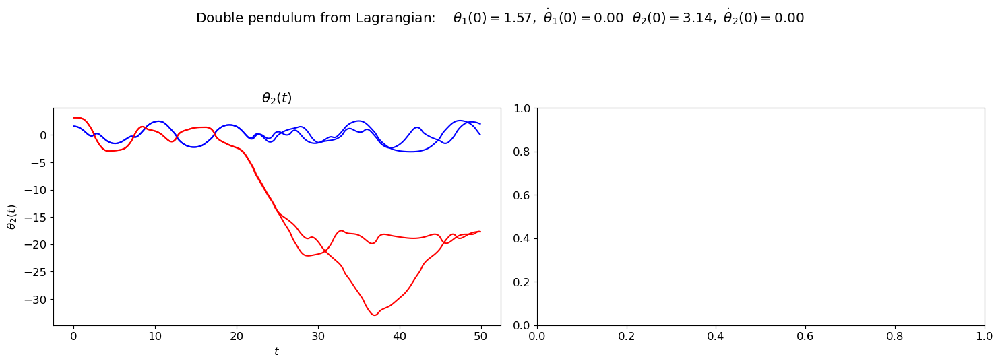

In [9]:
# start the plot!
fig = plt.figure(figsize=(15,5))
overall_title = 'Double pendulum from Lagrangian:  ' + \
                rf'  $\theta_1(0) = {theta1_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f}$' + \
                rf'  $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f}$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# first plot: theta1 plot 
ax_a = fig.add_subplot(1,2,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_stop)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta1_vs_time_labels, 
            color='blue',
            label=None, 
            title=r'$\theta_1(t)$', 
            ax=ax_a)    
                              
# second plot: theta2 plot                 

start, stop = start_stop_indices(t_pts, t_start, t_stop)    
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta2_vs_time_labels, 
            color='red',
            label=None, 
            title=r'$\theta_2(t)$', 
            ax=ax_a)    

ax_b = fig.add_subplot(1,2,2)                  

start, stop = start_stop_indices(t_pts, t_start, t_stop)    
plot_y_vs_x(t_pts[start : stop], theta1c[start : stop], 
            axis_labels=theta1_vs_time_labels, 
            color='blue',
            label=None, 
            title=r'$\theta_1(t)$', 
            ax=ax_a)    
                              
# second plot: theta2 plot                 

start, stop = start_stop_indices(t_pts, t_start, t_stop)    
plot_y_vs_x(t_pts[start : stop], theta2c[start : stop], 
            axis_labels=theta2_vs_time_labels, 
            color='red',
            label=None, 
            title=r'$\theta_2(t)$', 
            ax=ax_a)   

fig.tight_layout()
#fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')  

In [10]:
from matplotlib import animation, rc
from IPython.display import HTML

In [11]:
def coordinates(x0,y0,L,theta):
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x,y

In [12]:
%%capture

xmin = -1.5
xmax = -xmin
ymin = -1.5
ymax = -ymin

animated_pendulums = plt.figure(figsize=(12,5), num = 'Double pendulum')
ax_anim = animated_pendulums.add_subplot(1,1,1)
ax_anim.set_xlim(xmin,xmax)
ax_anim.set_ylim(ymin,ymax)

x0, y0 = 1.5, 0.
Origin_anim, = ax_anim.plot(x0, y0, 'o', markersize=6, color='blue') 

x1, y1 = coordinates(x0, y0, p1.L1, theta1[0])
Bob1_anim, = ax_anim.plot(x1, y1, 'o', markersize=8, color='blue')
Pend1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)
x2, y2 = coordinates(x1, y1, p1.L2, theta2[0])
Bob2_anim, = ax_anim.plot(x2, y2, 'o', markersize=8, color='blue')
Pend2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)


x1c, y1c = coordinates(x0, y0, p1.L1, theta1c[0])
Bob1_anim_c, = ax_anim.plot(x1c, y1c, 'o', markersize=8, color='red')
Pend1_anim_c, = ax_anim.plot([x0, x1c], [y0, y1c], color='red', lw=3)
x2c, y2c = coordinates(x1c, y1c, p1.L2, theta2c[0])
Bob2_anim_c, = ax_anim.plot(x2c, y2c, 'o', markersize=8, color='red')
Pend2_anim_c, = ax_anim.plot([x1c, x2c], [y1c, y2c], color='red', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
animated_pendulums.tight_layout()

In [13]:
def animate_pendulums(i):
    """
    This funciotn creates the ith animated frame in the objects trajectory.
    """
    
    i_skip = 2 * i
    
    x0, y0 = 0., 0.
    Origin_anim.set_data(x0, y0) 

    x1, y1 = coordinates(x0, y0, p1.L1, theta1[i_skip])
    Bob1_anim.set_data(x1, y1)
    Pend1_anim.set_data([x0, x1], [y0, y1])
    x2, y2 = coordinates(x1, y1, p1.L2, theta2[i_skip])
    Bob2_anim.set_data(x2, y2)
    Pend2_anim.set_data([x1, x2], [y1, y2])

    x1c, y1c = coordinates(x0, y0, p1.L1, theta1c[i_skip])
    Bob1_anim_c.set_data(x1c, y1c)
    Pend1_anim_c.set_data([x0, x1c], [y0, y1c])
    x2c, y2c = coordinates(x1c, y1c, p1.L2, theta2c[i_skip])
    Bob2_anim_c.set_data(x2c, y2c)
    Pend2_anim_c.set_data([x1c, x2c], [y1c, y2c])

    
    return (Origin_anim, Bob1_anim, Pend1_anim, Bob2_anim, Pend2_anim,
            Bob1_anim_c, Pend1_anim_c, Bob2_anim_c, Pend2_anim_c)

In [14]:
frame_interval = 20.
frame_num = 1001

anim = animation.FuncAnimation(animated_pendulums,
                              animate_pendulums,
                              init_func=None,
                              frames = frame_num,
                              interval = frame_interval,
                              blit = True,
                              repeat=False)

In [15]:
HTML(anim.to_jshtml())

## Interface using ipywidgets with interactive_output

We'll make a more elaborate interface so we can adjust all of the parameters.

In [16]:
# Import the widgets we will use (add more if needed!) 
import ipywidgets as widgets
from ipywidgets import HBox, VBox, Layout, Tab, Label, Checkbox
from ipywidgets import FloatSlider, IntSlider, Play, Dropdown, HTMLMath 

from IPython.display import display
from time import sleep

In [17]:
# This function generates the main output here, which is a grid of plots
def DP_plots(theta1_vs_time_plot=True, theta2_vs_time_plot=True,
             theta1_dot_vs_time_plot=True, theta2_dot_vs_time_plot=True,
             phase_space1_plot=True, phase_space2_plot=True,
             L1=1., L2=1., m1=1., m2=1., g=1.,
             theta1_0 = np.pi/2, theta1_dot_0 = 0., theta2_0 = 0., theta2_dot_0 = 0.,  
             t_start=0, t_end=10, delta_t=0.01, plot_start=0,
             font_size=18):
    """
    Create plots for interactive_output according to the inputs.
    
    Based on generating a Harmonic_oscillator instance and associated graphs.
    
    Notes
    -----
        1. We generate a new Harmonic_oscillator instance every time *and* 
            solve the ODE every time, even if the only change is to parameters
            like t_start and t_end.  Should we care or is this just so
            cheap to recalculate that it doesn't matter?
            How could we structure this differently?
        2. Should we delete ho1 at some point?  E.g., is there a memory issue?
    """
    
    # add delta_t it goes at least to t_end (probably should use linspace!)
    t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
        
    # Instantiate an oscillator with the passed (or default) values of the 
    #  natural frequency omega0, damping beta, driving amplitude, frequency, 
    #  and phase (f_ext, omega_ext, phi_ext).
    
    p1 = LagrangianDPendulum(L1=L1, L2=L2, g=g, m1=m1, m2=m2)
    z0 = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0]  # initial conditions for the oscillator ODE

    # ODE solver parameters
    abserr = 1.0e-8
    relerr = 1.0e-6

    # For now we solve with odeint; give more options in the future.
    #  The .T is for transpose, so that the matrix from odeint can changed
    #  to the correct form for reading off q and q_dot.
    theta1, theta1_dot, theta2, theta2_dot = odeint(p1.dy_dt, z0, t_pts,
                              atol=abserr, rtol=relerr).T
    
    
    # Update the common font size
    plt.rcParams.update({'font.size': font_size})
 
    # Labels for individual plot axes
    theta1_vs_time_labels = (r'$t$', r'$\theta_1$')
    theta2_vs_time_labels = (r'$t$', r'$\theta_2$')
    theta1_dot_vs_time_labels = (r'$t$', r'$\dot\theta_1$')
    theta2_dot_vs_time_labels = (r'$t$', r'$\dot\theta_2$')
    phase_space1_labels = (r'$\theta_1$', r'$\dot\theta_1$')
    phase_space2_labels = (r'$\theta_2$', r'$\dot\theta_2$')
    
    # Figure out how many rows and columns [one row for now]
    plot_flags = [theta1_vs_time_plot, theta2_vs_time_plot, theta1_dot_vs_time_plot, theta2_dot_vs_time_plot, phase_space1_plot, phase_space2_plot]
    plot_num = plot_flags.count(True)
    plot_rows = 1
    figsize_rows = plot_rows*6
    plot_cols = plot_num
    figsize_cols = min(plot_cols*8, 16)  # at most 16
    
    # Make the plot!
    fig = plt.figure(figsize=(figsize_cols,figsize_rows))
    #, axes = plt.subplots(plot_rows, plot_cols, 
                             
    # finds nearest index to plot_start in t_pts array                      
    start_index = (np.fabs(t_pts-plot_start)).argmin() 
    
    next_axis = 1  # keep track of the axis number
    if theta1_vs_time_plot:
        ax_theta1 = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(t_pts, theta1, axis_labels=theta1_vs_time_labels, 
                    label='Double Pendulum', title=r'$\theta1$ vs. time', 
                    ax=ax_theta1)    
        # add a line where the phase space plot starts
        ax_theta1.axvline(t_pts[start_index], lw=3, color='red')
                                             
        next_axis += 1
    
    if theta2_vs_time_plot:
        ax_theta2 = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(t_pts, theta2, axis_labels=theta2_vs_time_labels, 
                    label='Double Pendulum', title=r'$\theta2$ vs. time', 
                    ax=ax_theta2)    
        # add a line where the phase space plot starts
        ax_theta1.axvline(t_pts[start_index], lw=3, color='red')
                                             
        next_axis += 1
        
    if theta1_dot_vs_time_plot:
        ax_theta1_dot = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(t_pts, theta1_dot, axis_labels=theta1_dot_vs_time_labels, 
                    label='Double Pendulum', title=r'$\dot\theta1$ vs. time', 
                    ax=ax_theta1_dot)    
        # add a line where the phase space plot starts
        ax_theta1_dot.axvline(t_pts[start_index], lw=3, color='red')
                                             
        next_axis += 1    
    
    if theta2_dot_vs_time_plot:
        ax_theta2_dot = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(t_pts, theta2_dot, axis_labels=theta2_dot_vs_time_labels, 
                    label='Double Pendulum', title=r'$\dot\theta2$ vs. time', 
                    ax=ax_theta2_dot)    
        # add a line where the phase space plot starts
        ax_theta2_dot.axvline(t_pts[start_index], lw=3, color='red')
                                             
        next_axis += 1 

    if phase_space1_plot:
        ax_phase1_space = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(theta1[start_index:-1], theta1_dot[start_index:-1], 
                    axis_labels=phase_space1_labels, title='State space', 
                    ax=ax_phase_space1)  
        ax_phase_space.set_xlim(-1,1)
        ax_phase_space.set_ylim(-1,1)
        next_axis += 1
        
    if phase_space2_plot:
        ax_phase2_space = fig.add_subplot(plot_rows, plot_cols, next_axis)                  
        plot_y_vs_x(theta2[start_index:-1], theta2_dot[start_index:-1], 
                    axis_labels=phase_space2_labels, title='State space', 
                    ax=ax_phase_space2)  
        ax_phase_space.set_xlim(-1,1)
        ax_phase_space.set_ylim(-1,1)
        next_axis += 1
    
    fig.tight_layout()
    
    return fig




In [18]:
# Widgets for the various inputs.
#   For any widget, we can set continuous_update=False if we don't want the 
#    plots to shift until the selection is finished (particularly relevant for 
#    sliders).

# Widgets for the plot choice (plus a label out front)
plot_choice_w = Label(value='Which plots: ',layout=Layout(width='100px'))
def plot_choice_widget(on=True, plot_description=None):
    """Makes a Checkbox to select whether to show a plot."""
    return Checkbox(value=on, description=plot_description,
                  disabled=False, indent=False, layout=Layout(width='150px'))
theta1_vs_time_plot_w = plot_choice_widget(True, r'$\theta_1$ vs. time')
theta2_vs_time_plot_w = plot_choice_widget(True, r'$\theta_2$ vs. time')
theta1_dot_vs_time_plot_w = plot_choice_widget(False, r'$\dot\theta_1$ vs. time')
theta2_dot_vs_time_plot_w = plot_choice_widget(False, r'$\dot\theta_2$ vs. time')
phase_space1_plot_w = plot_choice_widget(True, 'state space')
phase_space2_plot_w = plot_choice_widget(True, 'state space')


# Widgets for the oscillator parameters (all use FloatSlider, so we made 
#  it a function)
def float_widget(value, min, max, step, description, format):
    """Makes a FloatSlider with the passed parameters and continuous_update
       set to False."""
    slider_border = Layout(border='solid 1.0px')
    return FloatSlider(value=value,min=min,max=max,step=step,disabled=False,
                       description=description,continuous_update=False,
                       orientation='horizontal',layout=slider_border,
                       readout=True,readout_format=format)

L1_w = float_widget(value=1., min=0.0, max=5., step=0.1,
                        description=r'length of first pendulum:', format='.2f')
L2_w = float_widget(value=1., min=0.0, max=5., step=0.1,
                        description=r'length of second pendulum:', format='.2f')
m1_w = float_widget(value=1., min=0.0, max=5., step=0.1,
                        description=r'mass of first pendulum:', format='.2f')
m2_w = float_widget(value=1., min=0.0, max=5., step=0.1,
                        description=r'mass of second pendulum:', format='.2f')
g_w = float_widget(value=1., min=0.0, max=5., step=0.1,
                        description=r'gravitational strength:', format='.2f')

# Widgets for the initial conditions
theta1_0_w = float_widget(value=0.0, min=-2.*np.pi, max=2.*np.pi, step=0.1,
                        description=r'$\theta_1(0)$:', format='.1f')
theta2_0_w = float_widget(value=0.0, min=-2.*np.pi, max=2.*np.pi, step=0.1,
                        description=r'$\theta_2(0)$:', format='.1f')
theta1_dot_0_w = float_widget(value=0.0, min=-100., max=100., step=0.1,
                        description=r'$\dot\theta_1(0)$:', format='.1f')
theta2_dot_0_w = float_widget(value=0.0, min=-100., max=100., step=0.1,
                        description=r'$\dot\theta_2(0)$:', format='.1f')

# Widgets for the plotting parameters
t_start_w = float_widget(value=0., min=0., max=10., step=1.,
                         description='t start:', format='.1f') 
t_end_w = float_widget(value=5., min=0., max=50., step=1.,
                       description='t end:', format='.1f')
delta_t_w = float_widget(value=0.001, min=0.001, max=0.1, step=0.001,
                         description='delta t:', format='.3f')
plot_start_w = float_widget(value=0., min=0., max=20., step=1.,
                            description='start plotting:', format='.1f')

# Widgets for the styling parameters
font_size_w = Dropdown(options=['12', '16', '18', '20', '24'], value='18',
                       description='Font size:',disabled=False,
                       continuous_update=False,layout=Layout(width='140px'))


############## Begin: Explicit callback functions #######################

# Make sure that t_end is at least t_start + 10
def update_t_end(*args):
    if t_end_w.value < t_start_w.value:
        t_end_w.value = t_start_w.value + 10     
t_end_w.observe(update_t_end, 'value')
t_start_w.observe(update_t_end, 'value')


# Make sure that plot_start is at least t_start and less than t_end
def update_plot_start(*args):
    if plot_start_w.value < t_start_w.value:
        plot_start_w.value = t_start_w.value
    if plot_start_w.value > t_end_w.value:
        plot_start_w.value = t_end_w.value
plot_start_w.observe(update_plot_start, 'value')
t_start_w.observe(update_plot_start, 'value')
t_end_w.observe(update_plot_start, 'value')


############## End: Explicit callback functions #######################

# Set up the interactive_output widget 
plot_out = widgets.interactive_output(DP_plots,
                          dict(
                            theta1_vs_time_plot=theta1_vs_time_plot_w, 
                            theta2_vs_time_plot=theta2_vs_time_plot_w,
                            theta1_dot_vs_time_plot=theta1_dot_vs_time_plot_w, 
                            theta2_dot_vs_time_plot=theta2_dot_vs_time_plot_w,
                            phase_space1_plot=phase_space1_plot_w, 
                            phase_space2_plot=phase_space1_plot_w,
                            L1=L1_w, 
                            L2=L2_w, 
                            m1=m1_w, 
                            m2=m2_w, 
                            g=g_w,
                            theta1_0 = theta1_0_w, 
                            theta1_dot_0 = theta1_dot_0_w, 
                            theta2_0 = theta2_0_w, 
                            theta2_dot_0 = theta2_dot_0_w,
                            t_start=t_start_w,
                            t_end=t_end_w, 
                            delta_t=delta_t_w,    
                            plot_start=plot_start_w, 
                            font_size=font_size_w) 
                       )

# Now do some manual layout, where we can put the plot anywhere using plot_out
dpbox1 = HBox([plot_choice_w, theta1_vs_time_plot_w, theta2_vs_time_plot_w, theta1_dot_vs_time_plot_w,
              theta2_dot_vs_time_plot_w, phase_space1_plot_w, phase_space2_plot_w]) #  choice of plots to show
dpbox2 = HBox([L1_w, L2_w, m1_w, m2_w, g_w]) # external driving parameters
dpbox3 = HBox([theta1_0_w, theta1_dot_0_w, theta2_0_w, theta2_dot_0_w]) # initial conditions and damping
dpbox4 = HBox([t_start_w, t_end_w, delta_t_w, plot_start_w]) # time, plot ranges
dpbox5 = HBox([font_size_w]) # font size

# We'll set up Tabs to organize the controls.  The Tab contents are declared
#  as tab0, tab1, ... (probably should make this a list?) and the overall Tab
#  is called tab (so its children are tab0, tab1, ...).
tab_height = '40px'  # Fixed minimum height for all tabs. Specify another way?
tab0 = VBox([dpbox2, dpbox3], layout=Layout(min_height=tab_height))
tab1 = VBox([dpbox1, dpbox4], layout=Layout(min_height=tab_height))
tab2 = VBox([dpbox5], layout=Layout(min_height=tab_height))

tab = Tab(children=[tab0, tab1, tab2])
tab.set_title(0, 'Physics')
tab.set_title(1, 'Plotting')
tab.set_title(2, 'Styling')

# Release the Kraken!
vbox2 = VBox([tab, plot_out])
display(vbox2)

## Investigations into Chaos

### Power Spectrum
First we must rerun the simulations large inital conditions which will lead to chaotic behavior.

In [19]:
theta1_0 = np.pi
theta2_0 = np.pi/2.
theta1_dot_0 = 0.
theta2_dot_0 = 0.
theta1c, theta1_dotc, theta2c, theta2_dotc = p1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0)

Text(0.5, 1.0, 'Power Spectrum for $\\theta_2$')

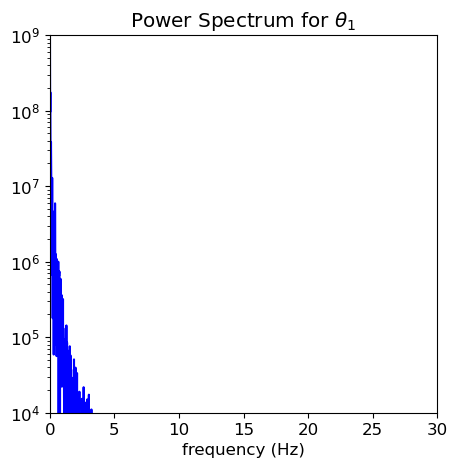

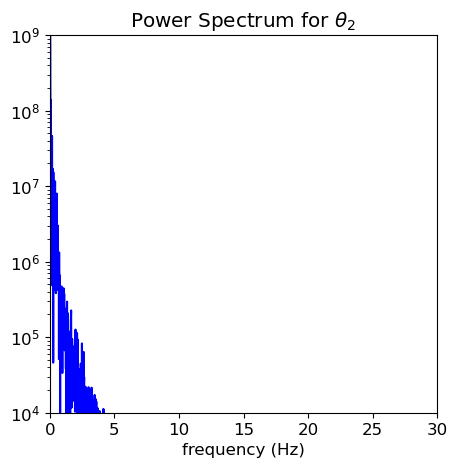

In [20]:
start, stop = start_stop_indices(t_pts, 20., t_end)    
signal1 = theta1c[start:stop]
power_spectrum1 = np.abs(np.fft.fft(signal1))**2
freqs1 = 2.*np.pi * np.fft.fftfreq(signal1.size, delta_t)
idx1 = np.argsort(freqs1)

signal2 = theta2c[start:stop]
power_spectrum2 = np.abs(np.fft.fft(signal2))**2
freqs2 = 2.*np.pi * np.fft.fftfreq(signal2.size, delta_t)
idx2 = np.argsort(freqs2)

fig_ps1 = plt.figure(figsize=(5,5))
ax_ps1 = fig_ps1.add_subplot(1,1,1)
ax_ps1.semilogy(freqs1[idx1], power_spectrum1[idx1], color='blue')
ax_ps1.set_xlim(0, 30.)
ax_ps1.set_ylim(1.e4, 1.e9)
ax_ps1.set_xlabel('frequency (Hz)')
ax_ps1.set_title('Power Spectrum for' + rf' $\theta_1$')

fig_ps2 = plt.figure(figsize=(5,5))
ax_ps2 = fig_ps2.add_subplot(1,1,1)
ax_ps2.semilogy(freqs2[idx2], power_spectrum2[idx2], color='blue')
ax_ps2.set_xlim(0, 30.)
ax_ps2.set_ylim(1.e4, 1.e9)
ax_ps2.set_xlabel('frequency (Hz)')
ax_ps2.set_title('Power Spectrum for' + rf' $\theta_2$')

#fig_ps.tight_layout()

We see that both angles have a continuous power spectrum which is a marker of chaotic motion

### $\Delta\theta$ Plots
We will start with two double pendulums with nearly identical initial conditions

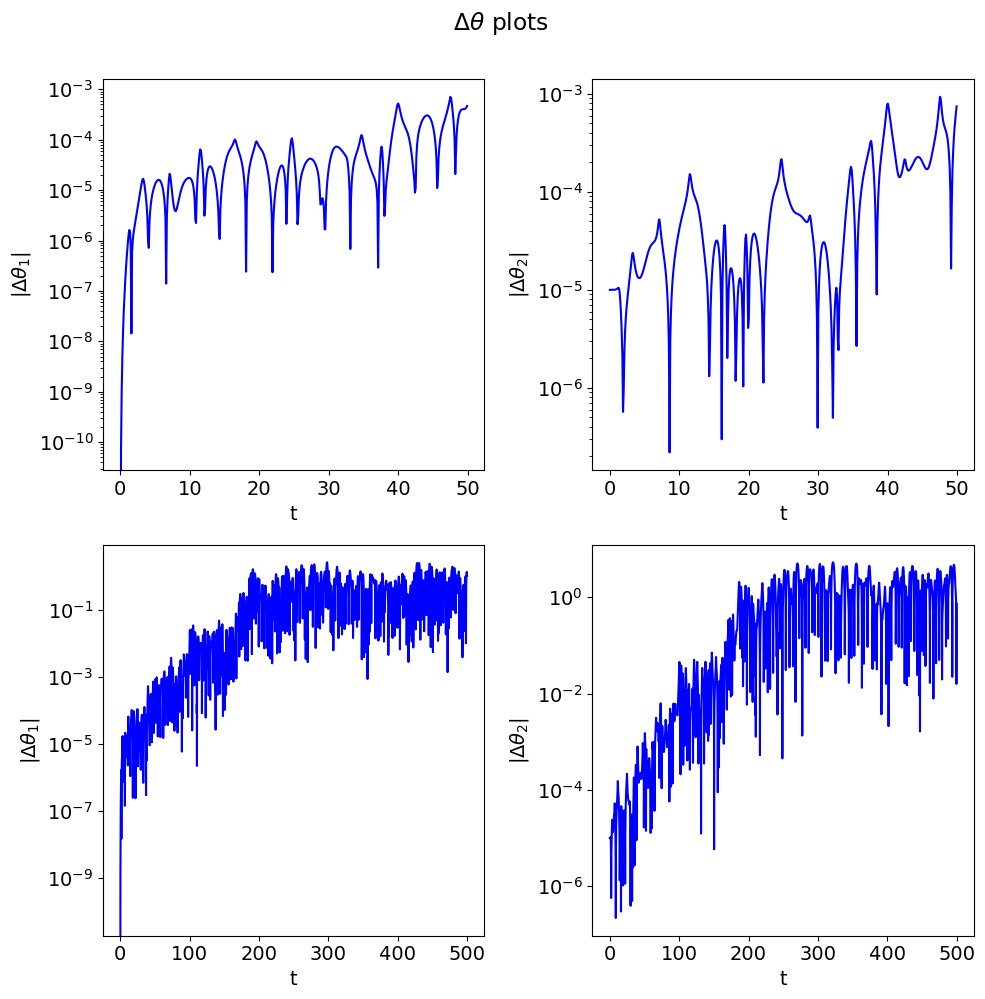

In [21]:
theta1_0_1 = np.pi/2.
theta2_0_1 = 0.
theta1_dot_0_1 = 0.
theta2_dot_0_1 = 0.
theta1_1, theta1_dot_1, theta2_1, theta2_dot_1 = p1.solve_ode(t_pts, theta1_0_1, theta1_dot_0_1, theta2_0_1, theta2_dot_0_1)

theta1_0_2 = np.pi/2.
theta2_0_2 = 0.00001 # this dictates the difference in the initial conditions
theta1_dot_0_2 = 0.
theta2_dot_0_2 = 0.
theta1_2, theta1_dot_2, theta2_2, theta2_dot_2 = p1.solve_ode(t_pts, theta1_0_2, theta1_dot_0_2, theta2_0_2, theta2_dot_0_2)

# Calculate the absolute difference in theta1
Delta_theta1 = np.fabs(theta1_2 - theta1_1)

# Calculate the absolute difference in theta2
Delta_theta2 = np.fabs(theta2_2 - theta2_1)

# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

# start the plot!
fig = plt.figure(figsize=(10,10))
overall_title = rf' $\Delta\theta$ plots'
fig.suptitle(overall_title, va='baseline')
    
# two plot: plot from t=0 to t=8 and another from t=0 to t=100 
ax_a = fig.add_subplot(2,2,1)                  

start, stop = start_stop_indices(t_pts, 0., 50.)
ax_a.semilogy(t_pts[start : stop], Delta_theta1[start : stop], 
            color='blue', label=None)    
ax_a.set_xlabel('t')
ax_a.set_ylabel(r'$|\Delta\theta_1|$')

ax_b = fig.add_subplot(2,2,2)                  

start, stop = start_stop_indices(t_pts, 0., 50.)
plot_y_vs_x(t_pts[start : stop], Delta_theta2[start : stop], 
            color='blue', label=None, semilogy=True)    
ax_b.set_xlabel('t')
ax_b.set_ylabel(r'$|\Delta\theta_2|$')

ax_c = fig.add_subplot(2,2,3)                  

start, stop = start_stop_indices(t_pts, 0., 500.)
ax_c.semilogy(t_pts[start : stop], Delta_theta1[start : stop], 
            color='blue', label=None)    
ax_c.set_xlabel('t')
ax_c.set_ylabel(r'$|\Delta\theta_1|$')

ax_d = fig.add_subplot(2,2,4)                  

start, stop = start_stop_indices(t_pts, 0., 500.)
plot_y_vs_x(t_pts[start : stop], Delta_theta2[start : stop], 
            color='blue', label=None, semilogy=True)    
ax_d.set_xlabel('t')
ax_d.set_ylabel(r'$|\Delta\theta_2|$')
                              
fig.tight_layout()
# always bbox_inches='tight' for best results.  Further adjustments also.
#fig.savefig('figure_12.11.png', bbox_inches='tight')  

We see that both $\Delta\theta_1$ and $\Delta\theta_2$ grow linearly on this semilog plot. This indicates that $\Delta\theta_1$ and $\Delta\theta_2$ both have a positive Lyopunov exponent, a characteristic of chaos.